In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 105.3 MB/s eta 0:00:00


In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        mask = (mask > 0.5).float()
        return image, mask

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"), dtype = np.float32)
        mask = np.array(Image.open(mask_path).convert("L"), dtype = np.uint8)

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)

        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0088, 0.0310, 0.0000,  ..., 0.2522, 0.3097, 0.3097],
         [0.0664, 0.0442, 0.0310,  ..., 0.2788, 0.2920, 0.3097],
         [0.0398, 0.0000, 0.0000,  ..., 0.2876, 0.3097, 0.3363],
         ...,
         [0.0973, 0.0929, 0.0487,  ..., 0.3319, 0.3230, 0.3009],
         [0.0531, 0.0354, 0.0752,  ..., 0.3894, 0.4248, 0.4115],
         [0.0310, 0.0000, 0.0265,  ..., 0.4248, 0.4867, 0.4646]],

        [[0.0398, 0.0000, 0.0575,  ..., 0.1504, 0.1460, 0.1549],
         [0.0177, 0.0088, 0.0310,  ..., 0.1416, 0.1372, 0.1814],
         [0.0000, 0.0177, 0.0664,  ..., 0.1372, 0.0619, 0.1726],
         ...,
         [0.0664, 0.0708, 0.1018,  ..., 0.2478, 0.2611, 0.2788],
         [0.0752, 0.0796, 0.0310,  ..., 0.4027, 0.3717, 0.3363],
         [0.0000, 0.0221, 0.0000,  ..., 0.4469, 0.4425, 0.3850]],

        [[0.0265, 0.0177, 0.0000,  ..., 0.0973, 0.1726, 0.0885],
         [0.0000, 0.0354, 0.0000,  ..., 0.1239, 0.1283, 0.1150],
         [0.0000, 0.0000, 0.0000,  ..., 0.1858, 0.1239, 0.

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [23]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0
            else:
                iou = 0.0
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [24]:
!pip install transformers datasets accelerate timm

In [25]:
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640",
    num_labels = 2,
    ignore_mismatched_sizes = True
).to(device)

for param in model.segformer.encoder.parameters():
    param.requires_grad = False

for param in model.segformer.encoder.block[3].parameters():
    param.requires_grad = True

for m in model.modules():
    if isinstance(m, nn.BatchNorm2d):
        for param in m.parameters():
            param.requires_grad = True

trainable_params = [p for p in model.parameters() if p.requires_grad]
print(f"Trainable parameters: {sum(p.numel() for p in trainable_params)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/339M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


model.safetensors:   0%|          | 0.00/339M [00:00<?, ?B/s]

Trainable parameters: 12670466


In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.0 MB/s eta 0:00:00


In [48]:
import torch.optim as optim
from tqdm import tqdm
import warnings
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
import optuna

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)

    optimizer = optim.AdamW([
        {"params": model.segformer.encoder.block[-1].parameters(), "lr": 0.0001},
        {"params": model.decode_head.parameters(), "lr": 0.0001}
    ])

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):

        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, _, _ in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(pixel_values = images)
            logits = outputs.logits

            logits = torch.nn.functional.interpolate(
                logits, size = masks.shape[2:], mode = "bilinear", align_corners = False
            )

            logits = logits[:, 1:2, :, :]
            loss = loss_func(logits, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(logits, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch + 1}/{num_epoch}")
        print(f"Train Loss: {avg_loss}, Train Avg IoU: {avg_iou}")

        model.eval()
        val_loss = 0
        val_iou = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                outputs = model(pixel_values=val_images)
                logits = outputs.logits
                logits = torch.nn.functional.interpolate(
                    logits, size = val_masks.shape[2:], mode = "bilinear", align_corners = False
                )
                logits = logits[:, 1:2, :, :]
                loss = loss_func(logits, val_masks.float())
                val_loss += loss.item()
                val_iou += calc_iou(logits, val_masks)

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val Loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1
        if trigger >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [49]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.2, 0.8), (0.1, 0.9), (0.0, 1.0)])

    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b5-finetuned-ade-640-640",
        num_labels = 2,
        ignore_mismatched_sizes = True
    )

    for param in model.segformer.encoder.parameters():
        param.requires_grad = False

    for param in model.segformer.encoder.block[3].parameters():
        param.requires_grad = True

    for m in model.modules():
        if isinstance(m, nn.BatchNorm2d):
            for param in m.parameters():
                param.requires_grad = True

    def batchnorm_to_groupnorm(model, num_groups = 32):
        for name, module in list(model.named_children()):
            if isinstance(module, nn.BatchNorm2d):
                num_features = module.num_features
                valid_num_groups = min(num_groups, num_features)
                while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                    valid_num_groups -= 1
                new_module = nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features)
                setattr(model, name, new_module)
            else:
                batchnorm_to_groupnorm(module, num_groups)
        return model

    model = batchnorm_to_groupnorm(model)
    model = model.to(device)

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    best_model, val_loss = train_model(
        model = model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = best_model

    return val_loss

In [50]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.7, 0.3)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-17 04:57:36,274] A new study created in memory with name: no-name-bdbc055a-e599-4f30-a9bd-56faac64eb25
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 0: scheduler = cosine, dice weight = 0.7, focal weight = 0.3



100%|██████████| 144/144 [00:16<00:00,  8.85it/s]


Epoch 1/25
Train Loss: 0.2596686325656871, Train Avg IoU: 0.6068214197204833


100%|██████████| 18/18 [00:01<00:00, 12.28it/s]


Val Loss: 0.21500929362244076, Val Avg IoU: 0.6534862236844169



100%|██████████| 144/144 [00:15<00:00,  9.44it/s]


Epoch 2/25
Train Loss: 0.18596250268941125, Train Avg IoU: 0.7031391223701777


100%|██████████| 18/18 [00:01<00:00, 13.05it/s]


Val Loss: 0.17838160838517877, Val Avg IoU: 0.6995649354325401



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 3/25
Train Loss: 0.15898842427931312, Train Avg IoU: 0.7365105681949191


100%|██████████| 18/18 [00:01<00:00, 13.05it/s]


Val Loss: 0.1536308355215523, Val Avg IoU: 0.7359346217579312



100%|██████████| 144/144 [00:15<00:00,  9.35it/s]


Epoch 4/25
Train Loss: 0.14497476981745827, Train Avg IoU: 0.7549679946775237


100%|██████████| 18/18 [00:01<00:00,  9.52it/s]


Val Loss: 0.14602303691208363, Val Avg IoU: 0.7444443139764998



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 5/25
Train Loss: 0.13358918997821295, Train Avg IoU: 0.767403754302197


100%|██████████| 18/18 [00:01<00:00, 12.78it/s]


Val Loss: 0.14302258462541634, Val Avg IoU: 0.7493834644556046



100%|██████████| 144/144 [00:15<00:00,  9.47it/s]


Epoch 6/25
Train Loss: 0.12928097234624955, Train Avg IoU: 0.77327075207399


100%|██████████| 18/18 [00:01<00:00, 12.81it/s]


Val Loss: 0.1384927456577619, Val Avg IoU: 0.7548595037725236



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 7/25
Train Loss: 0.12796247744053188, Train Avg IoU: 0.7753132327149311


100%|██████████| 18/18 [00:01<00:00, 13.05it/s]


Val Loss: 0.12990380078554153, Val Avg IoU: 0.7673617617951499



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 8/25
Train Loss: 0.12563235342450854, Train Avg IoU: 0.7780265678755112


100%|██████████| 18/18 [00:01<00:00, 11.21it/s]


Val Loss: 0.13080433093839222, Val Avg IoU: 0.7632982598410712



100%|██████████| 144/144 [00:15<00:00,  9.49it/s]


Epoch 9/25
Train Loss: 0.12197565702566256, Train Avg IoU: 0.7847665885670317


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.13882540518210995, Val Avg IoU: 0.7470810959736506



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 10/25
Train Loss: 0.11605353509852041, Train Avg IoU: 0.7942324378010299


100%|██████████| 18/18 [00:01<00:00, 13.13it/s]


Val Loss: 0.1319072614941332, Val Avg IoU: 0.7589686430162854



100%|██████████| 144/144 [00:15<00:00,  9.41it/s]


Epoch 11/25
Train Loss: 0.11807129225538422, Train Avg IoU: 0.7892184858727787


100%|██████████| 18/18 [00:01<00:00,  9.33it/s]


Val Loss: 0.13115019309851858, Val Avg IoU: 0.7612598389387131



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 12/25
Train Loss: 0.11508248472172353, Train Avg IoU: 0.79449945439895


100%|██████████| 18/18 [00:01<00:00, 12.81it/s]


Val Loss: 0.13579710365997422, Val Avg IoU: 0.7517941461669074



100%|██████████| 144/144 [00:15<00:00,  9.50it/s]


Epoch 13/25
Train Loss: 0.11526225890136427, Train Avg IoU: 0.7931163557287719


100%|██████████| 18/18 [00:01<00:00, 12.86it/s]


Val Loss: 0.13149113415016067, Val Avg IoU: 0.7579210019773908



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 14/25
Train Loss: 0.11297838341367121, Train Avg IoU: 0.7948320077525245


100%|██████████| 18/18 [00:01<00:00, 12.93it/s]


Val Loss: 0.13770861240724722, Val Avg IoU: 0.7506313522656759



100%|██████████| 144/144 [00:16<00:00,  8.95it/s]


Epoch 15/25
Train Loss: 0.11026255968802919, Train Avg IoU: 0.7995058440913757


100%|██████████| 18/18 [00:01<00:00, 11.01it/s]


Val Loss: 0.1288327280845907, Val Avg IoU: 0.7607215013768938



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 16/25
Train Loss: 0.11119062383659184, Train Avg IoU: 0.8047670887576209


100%|██████████| 18/18 [00:01<00:00, 12.92it/s]


Val Loss: 0.128736006302966, Val Avg IoU: 0.7627646608485116



100%|██████████| 144/144 [00:15<00:00,  9.43it/s]


Epoch 17/25
Train Loss: 0.11022762532552911, Train Avg IoU: 0.7994895128326284


100%|██████████| 18/18 [00:01<00:00, 13.07it/s]


Val Loss: 0.1323525926305188, Val Avg IoU: 0.7569732103082869



100%|██████████| 144/144 [00:15<00:00,  9.40it/s]


Epoch 18/25
Train Loss: 0.10804588861194336, Train Avg IoU: 0.8039024997916486


100%|██████████| 18/18 [00:01<00:00,  9.73it/s]


Val Loss: 0.133517657717069, Val Avg IoU: 0.7558952851427926



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 19/25
Train Loss: 0.10958575619022465, Train Avg IoU: 0.8004740246882042


100%|██████████| 18/18 [00:01<00:00, 12.82it/s]


Val Loss: 0.1285328008234501, Val Avg IoU: 0.7632608976629045



100%|██████████| 144/144 [00:15<00:00,  9.53it/s]


Epoch 20/25
Train Loss: 0.1080576925435, Train Avg IoU: 0.8044913851966461


100%|██████████| 18/18 [00:01<00:00, 13.20it/s]


Val Loss: 0.13183897195590866, Val Avg IoU: 0.7581063376532661



100%|██████████| 144/144 [00:15<00:00,  9.46it/s]


Epoch 21/25
Train Loss: 0.10796506164802445, Train Avg IoU: 0.8086002758807607


100%|██████████| 18/18 [00:01<00:00, 12.98it/s]


Val Loss: 0.13251716312434939, Val Avg IoU: 0.7572873019509845



100%|██████████| 144/144 [00:15<00:00,  9.17it/s]


Epoch 22/25
Train Loss: 0.1073124217800796, Train Avg IoU: 0.8048509061336517


100%|██████████| 18/18 [00:01<00:00,  9.78it/s]


Val Loss: 0.13433271791372034, Val Avg IoU: 0.7541604042053223



100%|██████████| 144/144 [00:15<00:00,  9.47it/s]


Epoch 23/25
Train Loss: 0.10779667483358127, Train Avg IoU: 0.8037277687754896


100%|██████████| 18/18 [00:01<00:00, 13.06it/s]


Val Loss: 0.13360393833782938, Val Avg IoU: 0.7557109230094485



100%|██████████| 144/144 [00:15<00:00,  9.49it/s]


Epoch 24/25
Train Loss: 0.10662818535800195, Train Avg IoU: 0.8050521392789152


100%|██████████| 18/18 [00:01<00:00, 12.56it/s]


Val Loss: 0.13367728826900324, Val Avg IoU: 0.755630890528361



100%|██████████| 144/144 [00:15<00:00,  9.47it/s]


Epoch 25/25
Train Loss: 0.11086130174549504, Train Avg IoU: 0.7986211441457272


100%|██████████| 18/18 [00:01<00:00, 11.01it/s]
[I 2025-11-17 05:04:41,839] Trial 0 finished with value: 0.1285328008234501 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.7, 0.3)}. Best is trial 0 with value: 0.1285328008234501.


Val Loss: 0.13356635553969276, Val Avg IoU: 0.7557889537678825



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 1: scheduler = reducelr, dice weight = 0.7, focal weight = 0.3



100%|██████████| 144/144 [00:15<00:00,  9.35it/s]


Epoch 1/25
Train Loss: 0.2670902526523504, Train Avg IoU: 0.5928404297466415


100%|██████████| 18/18 [00:01<00:00, 13.08it/s]


Val Loss: 0.2077075762467252, Val Avg IoU: 0.6922513792912165



100%|██████████| 144/144 [00:15<00:00,  9.46it/s]


Epoch 2/25
Train Loss: 0.1784824662350325, Train Avg IoU: 0.7229786278007345


100%|██████████| 18/18 [00:01<00:00, 13.35it/s]


Val Loss: 0.18067420480979812, Val Avg IoU: 0.7024884712364938



100%|██████████| 144/144 [00:15<00:00,  9.49it/s]


Epoch 3/25
Train Loss: 0.1559072624400465, Train Avg IoU: 0.7398079904831119


100%|██████████| 18/18 [00:01<00:00, 11.25it/s]


Val Loss: 0.15252534631225798, Val Avg IoU: 0.7388331525855594



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 4/25
Train Loss: 0.14405771859714556, Train Avg IoU: 0.7564396030890445


100%|██████████| 18/18 [00:01<00:00, 13.01it/s]


Val Loss: 0.14780573836631244, Val Avg IoU: 0.742975213461452



100%|██████████| 144/144 [00:15<00:00,  9.42it/s]


Epoch 5/25
Train Loss: 0.13877987605519593, Train Avg IoU: 0.7597681768238544


100%|██████████| 18/18 [00:01<00:00, 12.77it/s]


Val Loss: 0.1404846418235037, Val Avg IoU: 0.7539290570550494



100%|██████████| 144/144 [00:15<00:00,  9.41it/s]


Epoch 6/25
Train Loss: 0.12922308654783088, Train Avg IoU: 0.7745364720208777


100%|██████████| 18/18 [00:01<00:00, 12.30it/s]


Val Loss: 0.1436968460265133, Val Avg IoU: 0.7415962484147813



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 7/25
Train Loss: 0.12425566747939835, Train Avg IoU: 0.7815386694338586


100%|██████████| 18/18 [00:02<00:00,  8.72it/s]


Val Loss: 0.1355265093346437, Val Avg IoU: 0.7599072158336639



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 8/25
Train Loss: 0.12278556633585443, Train Avg IoU: 0.7830025402622091


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.1406358807451195, Val Avg IoU: 0.7465204132927789



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 9/25
Train Loss: 0.12196517012651181, Train Avg IoU: 0.7828836955337061


100%|██████████| 18/18 [00:01<00:00, 12.86it/s]


Val Loss: 0.12981741751233736, Val Avg IoU: 0.7636959933572345



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 10/25
Train Loss: 0.11786250420846045, Train Avg IoU: 0.789605559160312


100%|██████████| 18/18 [00:01<00:00, 10.62it/s]


Val Loss: 0.1363900357650386, Val Avg IoU: 0.7522061616182327



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 11/25
Train Loss: 0.11611127337285627, Train Avg IoU: 0.7912681435959207


100%|██████████| 18/18 [00:01<00:00, 13.02it/s]


Val Loss: 0.11791300339003404, Val Avg IoU: 0.7851527879635493



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 12/25
Train Loss: 0.11477192676910716, Train Avg IoU: 0.7930738762434986


100%|██████████| 18/18 [00:01<00:00, 12.83it/s]


Val Loss: 0.12461724297867881, Val Avg IoU: 0.7713021404213376



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 13/25
Train Loss: 0.1160070981649268, Train Avg IoU: 0.7923333133156929


100%|██████████| 18/18 [00:01<00:00, 12.66it/s]


Val Loss: 0.13016995187434885, Val Avg IoU: 0.7598753985431459



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 14/25
Train Loss: 0.11153898089994779, Train Avg IoU: 0.7970637434886562


100%|██████████| 18/18 [00:01<00:00,  9.83it/s]


Val Loss: 0.11956666865282589, Val Avg IoU: 0.7786409556865692



100%|██████████| 144/144 [00:15<00:00,  9.39it/s]


Epoch 15/25
Train Loss: 0.11054686784175122, Train Avg IoU: 0.7979835853394535


100%|██████████| 18/18 [00:01<00:00, 12.91it/s]


Val Loss: 0.12179832595090072, Val Avg IoU: 0.7760693695810106



100%|██████████| 144/144 [00:15<00:00,  9.42it/s]


Epoch 16/25
Train Loss: 0.11321605725162145, Train Avg IoU: 0.7960982853546739


100%|██████████| 18/18 [00:01<00:00, 12.98it/s]


Val Loss: 0.1208988871011469, Val Avg IoU: 0.7771010978354348



100%|██████████| 144/144 [00:15<00:00,  9.50it/s]


Epoch 17/25
Train Loss: 0.10922296453888218, Train Avg IoU: 0.8005709006554551


100%|██████████| 18/18 [00:01<00:00, 11.09it/s]


Val Loss: 0.1252056231929196, Val Avg IoU: 0.7658642033735911



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 18/25
Train Loss: 0.10774565472578009, Train Avg IoU: 0.8024128853446908


100%|██████████| 18/18 [00:01<00:00, 13.18it/s]


Val Loss: 0.11748534585866663, Val Avg IoU: 0.7809980246755812



100%|██████████| 144/144 [00:15<00:00,  9.50it/s]


Epoch 19/25
Train Loss: 0.10603022933678909, Train Avg IoU: 0.806526341372066


100%|██████████| 18/18 [00:01<00:00, 13.27it/s]


Val Loss: 0.12497775898211533, Val Avg IoU: 0.7670146524906158



100%|██████████| 144/144 [00:15<00:00,  9.57it/s]


Epoch 20/25
Train Loss: 0.10698925401730877, Train Avg IoU: 0.803737185895443


100%|██████████| 18/18 [00:01<00:00, 13.14it/s]


Val Loss: 0.121376884687278, Val Avg IoU: 0.7729587074783113



100%|██████████| 144/144 [00:15<00:00,  9.44it/s]


Epoch 21/25
Train Loss: 0.10423101029462284, Train Avg IoU: 0.8083853885117505


100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


Val Loss: 0.12631824467745092, Val Avg IoU: 0.7641889320479499



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 22/25
Train Loss: 0.10619427010856776, Train Avg IoU: 0.8043103147712019


100%|██████████| 18/18 [00:01<00:00, 13.06it/s]


Val Loss: 0.12212927142779033, Val Avg IoU: 0.7693975336021848



100%|██████████| 144/144 [00:15<00:00,  9.54it/s]


Epoch 23/25
Train Loss: 0.10444016695126063, Train Avg IoU: 0.8080131502615081


100%|██████████| 18/18 [00:01<00:00, 13.20it/s]


Val Loss: 0.12168029530180825, Val Avg IoU: 0.7715507017241584



100%|██████████| 144/144 [00:15<00:00,  9.53it/s]


Epoch 24/25
Train Loss: 0.1022157927768098, Train Avg IoU: 0.8115715285142263


100%|██████████| 18/18 [00:01<00:00, 13.24it/s]


Val Loss: 0.12280927101771037, Val Avg IoU: 0.7681734147999022



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 25/25
Train Loss: 0.1027419317397289, Train Avg IoU: 0.8099331979950269


100%|██████████| 18/18 [00:01<00:00,  9.26it/s]
[I 2025-11-17 05:11:46,751] Trial 1 finished with value: 0.11748534585866663 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.7, 0.3)}. Best is trial 1 with value: 0.11748534585866663.


Val Loss: 0.12466228173838721, Val Avg IoU: 0.7657526814275317



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 2: scheduler = steplr, dice weight = 0.7, focal weight = 0.3



100%|██████████| 144/144 [00:15<00:00,  9.49it/s]


Epoch 1/25
Train Loss: 0.25834580658314127, Train Avg IoU: 0.6195436877521003


100%|██████████| 18/18 [00:01<00:00, 13.32it/s]


Val Loss: 0.19956321662498844, Val Avg IoU: 0.6955827648440996



100%|██████████| 144/144 [00:15<00:00,  9.51it/s]


Epoch 2/25
Train Loss: 0.17883385120270154, Train Avg IoU: 0.7186738020863727


100%|██████████| 18/18 [00:01<00:00, 13.11it/s]


Val Loss: 0.19017978178130257, Val Avg IoU: 0.6801215956608454



100%|██████████| 144/144 [00:15<00:00,  9.46it/s]


Epoch 3/25
Train Loss: 0.15298617530303696, Train Avg IoU: 0.7427009398945503


100%|██████████| 18/18 [00:01<00:00,  9.47it/s]


Val Loss: 0.15551691171195772, Val Avg IoU: 0.7343308909071816



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 4/25
Train Loss: 0.14141346145576486, Train Avg IoU: 0.7603597613051534


100%|██████████| 18/18 [00:01<00:00, 12.87it/s]


Val Loss: 0.14875075221061707, Val Avg IoU: 0.7444484714004729



100%|██████████| 144/144 [00:15<00:00,  9.45it/s]


Epoch 5/25
Train Loss: 0.1335055104896633, Train Avg IoU: 0.7698562555015087


100%|██████████| 18/18 [00:01<00:00, 13.08it/s]


Val Loss: 0.14033680429889095, Val Avg IoU: 0.7511570652325948



100%|██████████| 144/144 [00:15<00:00,  9.49it/s]


Epoch 6/25
Train Loss: 0.12997527490369976, Train Avg IoU: 0.7746046268277698


100%|██████████| 18/18 [00:01<00:00, 11.88it/s]


Val Loss: 0.14090762680603397, Val Avg IoU: 0.7524686025248634



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 7/25
Train Loss: 0.12618528618218583, Train Avg IoU: 0.7780700864063369


100%|██████████| 18/18 [00:01<00:00, 11.85it/s]


Val Loss: 0.14121166471805838, Val Avg IoU: 0.7514370315604739



100%|██████████| 144/144 [00:15<00:00,  9.40it/s]


Epoch 8/25
Train Loss: 0.12378516506093244, Train Avg IoU: 0.7797337621450424


100%|██████████| 18/18 [00:01<00:00, 12.94it/s]


Val Loss: 0.1367224214805497, Val Avg IoU: 0.7589244710074531



100%|██████████| 144/144 [00:15<00:00,  9.43it/s]


Epoch 9/25
Train Loss: 0.12318802152812067, Train Avg IoU: 0.7827485292736027


100%|██████████| 18/18 [00:01<00:00, 13.27it/s]


Val Loss: 0.1449140506900019, Val Avg IoU: 0.7414373921023475



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 10/25
Train Loss: 0.1219101644302201, Train Avg IoU: 0.7821352241767777


100%|██████████| 18/18 [00:01<00:00,  9.23it/s]


Val Loss: 0.13866188998023668, Val Avg IoU: 0.7516885747512182



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 11/25
Train Loss: 0.11657957745612496, Train Avg IoU: 0.7908600574980179


100%|██████████| 18/18 [00:01<00:00, 12.87it/s]


Val Loss: 0.136023986670706, Val Avg IoU: 0.7558878974782096



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 12/25
Train Loss: 0.11864870985866421, Train Avg IoU: 0.7871411500705613


100%|██████████| 18/18 [00:01<00:00, 13.12it/s]


Val Loss: 0.13601344409916136, Val Avg IoU: 0.7548401604096094



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 13/25
Train Loss: 0.11758275667024362, Train Avg IoU: 0.7887677821434207


100%|██████████| 18/18 [00:01<00:00, 11.73it/s]


Val Loss: 0.13731077230638927, Val Avg IoU: 0.7525293678045273



100%|██████████| 144/144 [00:16<00:00,  8.90it/s]


Epoch 14/25
Train Loss: 0.11679507497077186, Train Avg IoU: 0.7913967797325717


100%|██████████| 18/18 [00:01<00:00, 12.80it/s]


Val Loss: 0.1326411519613531, Val Avg IoU: 0.7593589358859592



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 15/25
Train Loss: 0.11795826827357006, Train Avg IoU: 0.7891904722071357


100%|██████████| 18/18 [00:01<00:00, 12.75it/s]


Val Loss: 0.1301824026223686, Val Avg IoU: 0.7634727855523428



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 16/25
Train Loss: 0.11193402688432899, Train Avg IoU: 0.7983300971488158


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.13053234625193808, Val Avg IoU: 0.7631350010633469



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 17/25
Train Loss: 0.11343342836739288, Train Avg IoU: 0.795791200051705


100%|██████████| 18/18 [00:01<00:00,  9.87it/s]


Val Loss: 0.13172701228823927, Val Avg IoU: 0.7610011266337501



100%|██████████| 144/144 [00:15<00:00,  9.35it/s]


Epoch 18/25
Train Loss: 0.11577542575671235, Train Avg IoU: 0.7932564162959655


100%|██████████| 18/18 [00:01<00:00, 12.93it/s]


Val Loss: 0.13135188010831675, Val Avg IoU: 0.7604955716265572



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 19/25
Train Loss: 0.1139311531248192, Train Avg IoU: 0.7947734780609608


100%|██████████| 18/18 [00:01<00:00, 13.04it/s]


Val Loss: 0.13172500911686155, Val Avg IoU: 0.7598602622747421



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 20/25
Train Loss: 0.11260148239994629, Train Avg IoU: 0.7952877336906062


100%|██████████| 18/18 [00:01<00:00,  9.46it/s]


Val Loss: 0.13139604611529243, Val Avg IoU: 0.7602230691247516



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 21/25
Train Loss: 0.11200419067042983, Train Avg IoU: 0.7994239947034253


100%|██████████| 18/18 [00:01<00:00, 12.80it/s]


Val Loss: 0.13160266851385435, Val Avg IoU: 0.7598105387555228



100%|██████████| 144/144 [00:15<00:00,  9.24it/s]


Epoch 22/25
Train Loss: 0.11290175392706361, Train Avg IoU: 0.796715553642975


100%|██████████| 18/18 [00:01<00:00, 12.12it/s]


Val Loss: 0.1318820644583967, Val Avg IoU: 0.7591715455055237



100%|██████████| 144/144 [00:15<00:00,  9.43it/s]


Epoch 23/25
Train Loss: 0.11121947708953586, Train Avg IoU: 0.7981939752482705


100%|██████████| 18/18 [00:01<00:00, 13.28it/s]


Val Loss: 0.13002886147134834, Val Avg IoU: 0.7618561221493615



100%|██████████| 144/144 [00:16<00:00,  8.98it/s]


Epoch 24/25
Train Loss: 0.11096050197051631, Train Avg IoU: 0.8067185007449653


100%|██████████| 18/18 [00:01<00:00, 12.23it/s]


Val Loss: 0.13013348086840576, Val Avg IoU: 0.7619710597727034



100%|██████████| 144/144 [00:15<00:00,  9.50it/s]


Epoch 25/25
Train Loss: 0.11157771835051891, Train Avg IoU: 0.7991400493515862


100%|██████████| 18/18 [00:01<00:00, 13.08it/s]
[I 2025-11-17 05:18:53,146] Trial 2 finished with value: 0.13002886147134834 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.7, 0.3)}. Best is trial 1 with value: 0.11748534585866663.


Val Loss: 0.13168494320578045, Val Avg IoU: 0.7594196200370789



In [51]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.7, 0.3)}
Best val loss: 0.11748534585866663


In [52]:
fine_tune_model.eval()

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)

In [53]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        if intersection == 0:
            return 1.0
        else:
            return 0.0
    else:
        iou = intersection / union
        return iou

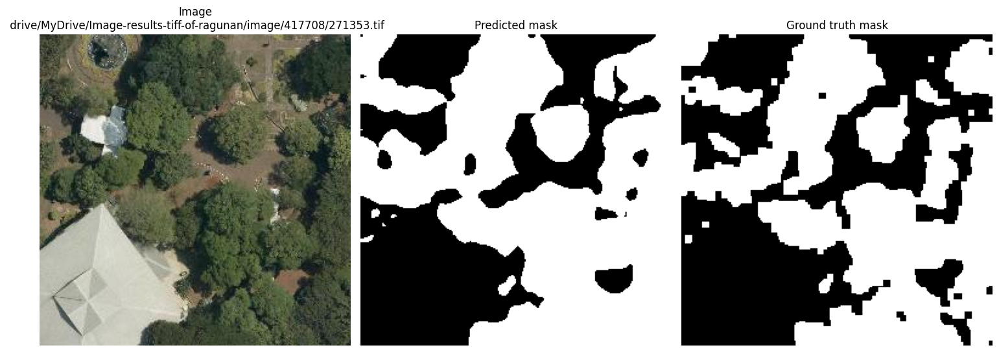

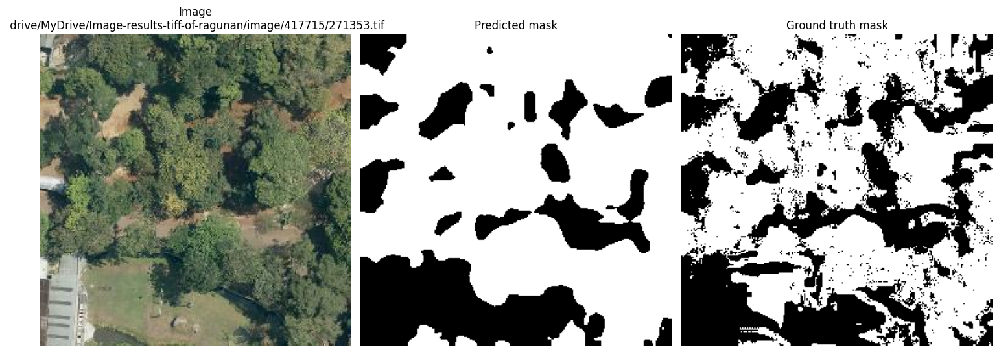

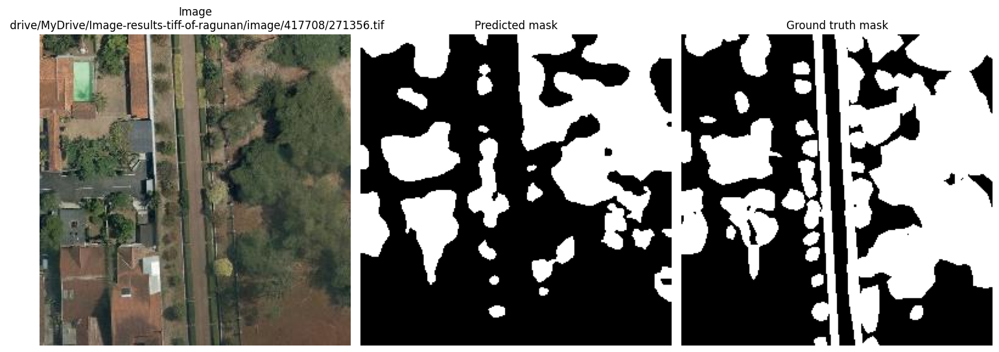

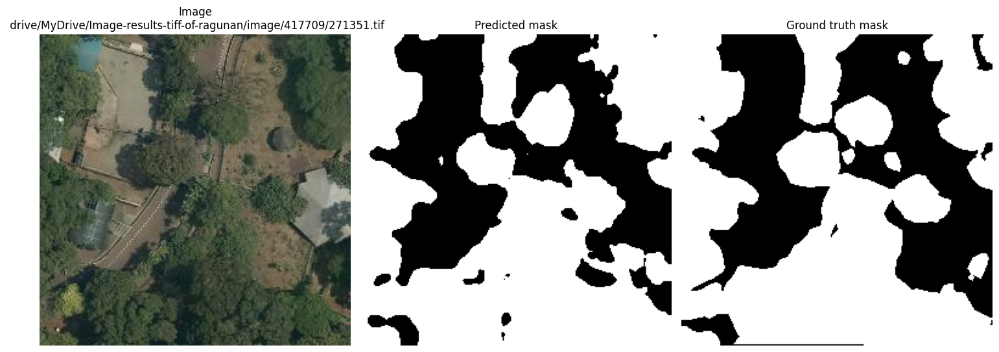

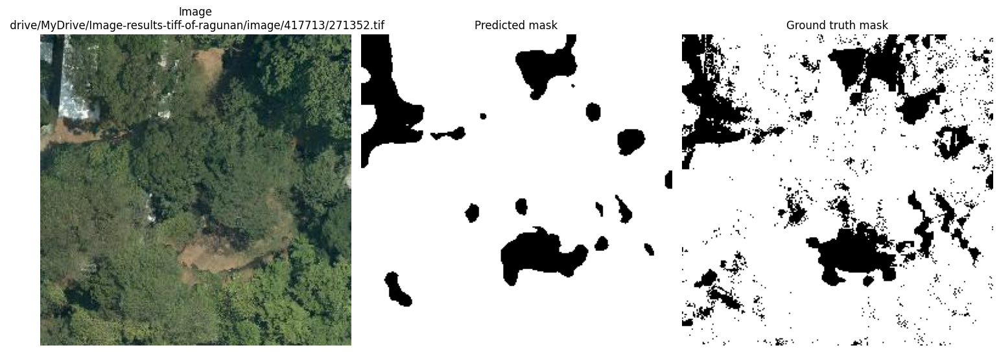

...

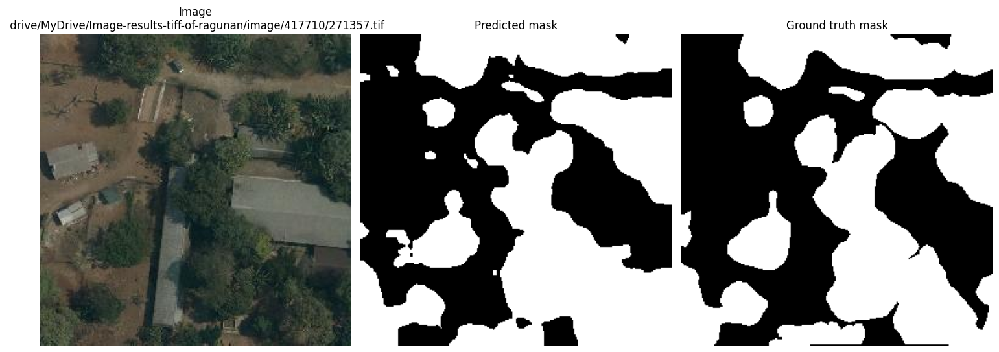

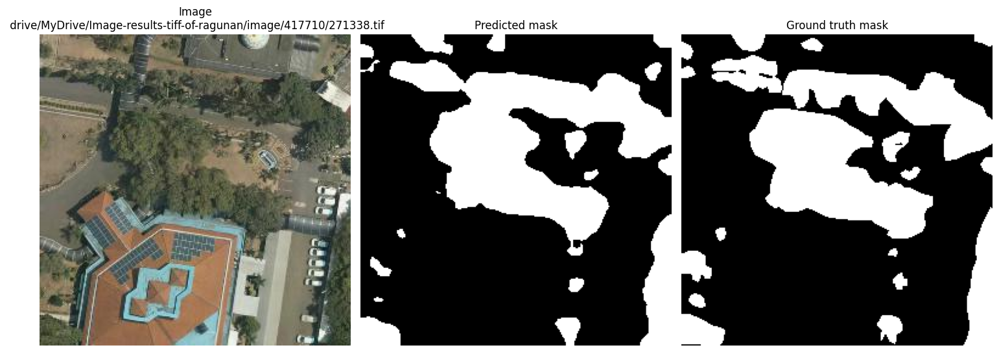

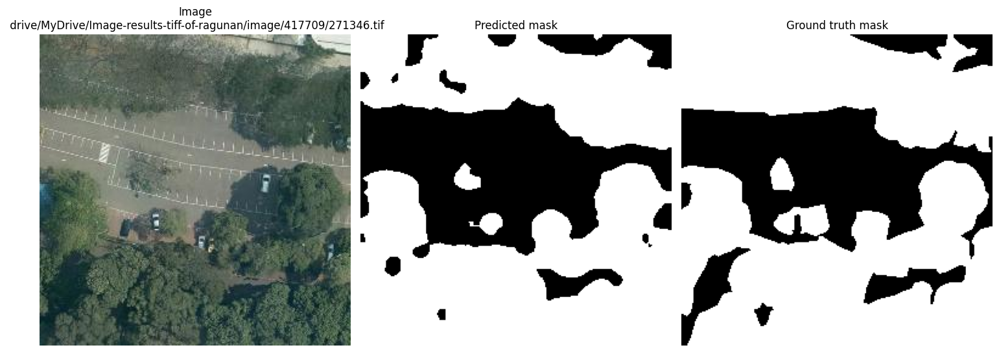

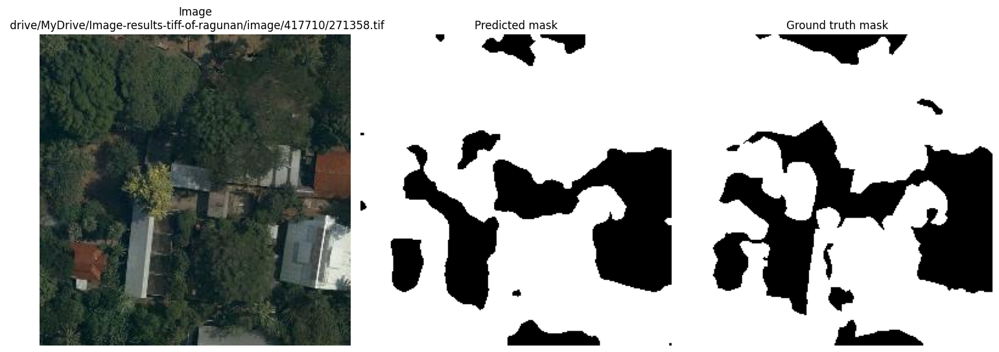

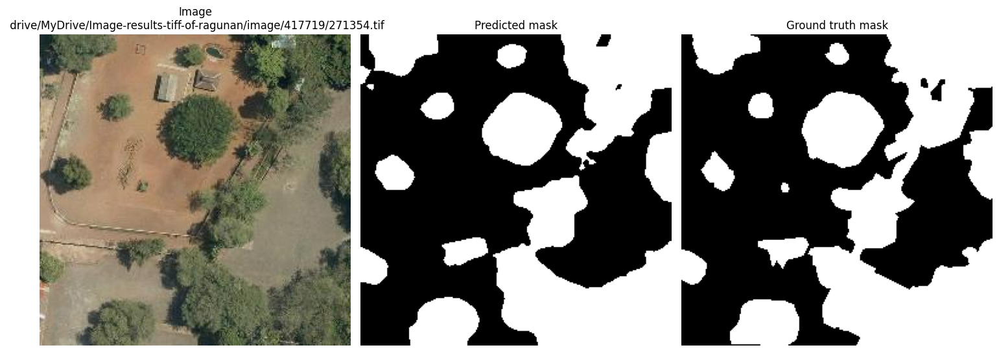

In [54]:
bin_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for images, masks, image_path, mask_path in test_loader:
        images = images.to(device)

        outputs = fine_tune_model(pixel_values = images)
        logits = outputs.logits

        upsampled_logits = F.interpolate(
            logits, size = masks.shape[-2:], mode = "bilinear", align_corners = False
        )

        probs = torch.softmax(upsampled_logits, dim = 1)
        preds = (probs[:, 1, :, :] > 0.5).cpu().numpy().astype(np.uint8) * 255

        for i in range(len(image_path)):
            img_path = image_path[i]
            mask_gt_path = mask_path[i]

            with rasterio.open(img_path) as src:
                img = src.read([1, 2, 3])
                img = np.transpose(img, (1, 2, 0))

            gt_mask = cv2.imread(mask_gt_path, cv2.IMREAD_GRAYSCALE)
            pred_mask = preds[i]

            bin_masks.append(pred_mask)
            gt_masks.append(gt_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title(f"Image\n {img_path}")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(pred_mask, cmap="gray")
            plt.title("Predicted mask")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap="gray")
            plt.title("Ground truth mask")
            plt.axis("off")

            plt.tight_layout()
            plt.show()

In [55]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 39825
Vegetation coverage area: 22414.701283231003
IoU score: 0.8353069414854085
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 45835
Vegetation coverage area: 3561.7429615700144
IoU score: 0.7516719320559636
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 22651
Vegetation coverage area: 12748.660358228888
IoU score: 0.5951540813926135
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 39758
Vegetation coverage area: 22376.991679063358
IoU score: 0.8595477446930443
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 57625


In [65]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 22414.701283231003 m^2
Carbon density: 0.007238926356283162 ton/m^2
Estimated carbon stock: 162.25837188739493 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3561.7429615700144 m^2
Carbon density: 0.007238926356283162 ton/m^2
Estimated carbon stock: 25.783194998815222 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 12748.660358228888 m^2
Carbon density: 0.007238926356283162 ton/m^2
Estimated carbon stock: 92.28661347448543 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 22376.991679063358 m^2
Carbon density: 0.007238926356283162 ton/m^2
Estimated carbon stock: 161.98539483990075 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4477.9194537028925 m^2
Carbon density: 0.